<hr/>
<div class="alert alert-success alertsuccess" style="margin-top: 20px">
[Tip]: To execute the Python code in the code cell below, click on the cell to select it and press <kbd>Shift</kbd> + <kbd>Enter</kbd>.
</div>
<hr/>

### Required Libraries

In [1]:
from aeon.segmentation import find_dominant_window_sizes

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import os
import fnmatch
import zipfile

%config InlineBackend.figure_formats = {'png', 'retina'}

### Utility functions

def read_series(file, locations):
    # file is e.g. "000_Anomaly_2500.csv"
    internal_name = folder_in_zip + file
    print(internal_name)

    with zf.open(internal_name) as f:
        data = pd.read_csv(f, header=None)

    data = np.array(data).flatten()

    # Extract file name
    file_name = file.split('.')[0]
    splits = file_name.split('_')
    test_start = np.array(splits[-1])

    # Extract anomaly location
    anomaly = (-1, -1)
    if file_name in locations.index:
        row = locations.loc[file_name]
        anomaly = row["Start"], row["End"]    

    return (file_name, int(test_start), data, anomaly)

def sliding_window(a, window):
    shape = a.shape[:-1] + (a.shape[-1] - window + 1, window)
    strides = a.strides + (a.strides[-1],)
    return np.lib.stride_tricks.as_strided(a, shape=shape, strides=strides)


def visualize_with_anomaly_score(
        data, score, test_start, 
        predicted, anomaly, name = None
        ):
    '''Input:
       data: array with the raw data
       test_start: the offset where the test data starts
       predicted: The offset of your prediction.
       anomaly: The offset of the anomaly. 
                      If -1 is passed, no anomaly is plottet.
    '''
    
    anomaly_start = anomaly[0]
    anomaly_end = anomaly[1]
    predicted_start = max(0, predicted - 50)
    predicted_end = min(predicted + 50, data.shape[-1])
    
    fig, ax = plt.subplots(2,1, figsize=(20, 4), sharex=True)
    sns.lineplot(x=np.arange(test_start, len(data)), y=data[test_start:], ax = ax[0], lw=0.5, label="Test")
    sns.lineplot(x=np.arange(0, test_start), y=data[:test_start], ax = ax[0], lw=0.5, label="Train")
        
    if (anomaly_start > 0):
        sns.lineplot(x=np.arange(anomaly_start, anomaly_end), 
                     y=data[anomaly_start:anomaly_end], ax = ax[0], label="Actual", color="green")
    
    sns.lineplot(x=np.arange(len(score)), y=score, ax = ax[1], label="Anomaly Scores")
    sns.lineplot(x=np.arange(predicted_start, predicted_end), 
                 y=data[predicted_start:predicted_end], ax = ax[0], label="Predicted", color="red")

    if name is not None:
        ax[0].set_title(name)
        
    sns.despine()

    plt.legend()
    plt.show()


locations = pd.read_csv("labels.csv")
locations.set_index("Name", inplace=True)

zip_path = "phase_1.zip"
folder_in_zip = "phase_1/"

# Pre-open the zip for listing files
zf = zipfile.ZipFile(zip_path)

# All CSV files inside phase_1/ (excluding labels.csv for the widget)
file_list = np.sort([
    name[len(folder_in_zip):]  # strip "phase_1/" so widget shows just the filename
    for name in zf.namelist()
    if name.startswith(folder_in_zip)
       and fnmatch.fnmatch(name, "*.csv")
       and not name.endswith("labels.csv")
])    

# Exercise 3 - Anomaly Detection

## Dataset
In this notebook, you must implement methods for detecting anomalies in time series.

<img src="https://box.hu-berlin.de/f/53a91798173c4dad9345/?dl=1" width=800/>

You are given 30 time series with clean train segments and anomalous test segments:

- TRAIN: Normal data only
- TEST:  Exactly 1 anomaly per series (unknown size/shape)

### TASK: Implement $\geq 3$ anomaly detection approaches, with two coming from different categories.

1. Distance-Based (e.g., k-Nearest Neighbor Classifier)
2. Model-Based (e.g., Isolation Forest, LOF, One-Class-SVM)
3. Regression-Based (e.g., linear / polynomial regression)
4. Forecasting-Based (e.g., Prophet, ARIMA)
5. Clustering-Based (e.g., DBSCAN)
6. Statistics-Based (e.g., IQR, KDE)

**Hints:**
- You may use Vibe Coding to solve this exercise.
- You may play around with **pre-processing**. **This counts as a different approach**

### You must hand in this exercise via Moodle and submit predictions to Kaggle.

<hr/>

# Anomaly Detection using Predictive Modelling

You are given wrappers, which you can use to implement methods. Each wrapper returns a score-profile and the predicted anomaly. The score's maximum indicates where the anomaly is.

<img src="https://box.hu-berlin.de/f/2812ccfbcae24e318f9e/?dl=1" width=800/>

In [31]:
from sklearn.neighbors import NearestNeighbors, KernelDensity
from statsmodels.tsa.arima.model import ARIMA
from sklearn.ensemble import IsolationForest

# Distance-based anomaly scores
# e.g. k-Nearest Neighbor Classifier
# see: https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
def nearest_neighbor_based_score(X, test_start):
    score = np.zeros(len(X))
    # TODO: fill in code here as needed

    X_train = X[:test_start]
    X_test = X[test_start:]

    nn = NearestNeighbors(n_neighbors=1)
    nn.fit(X_train)

    distances, _ = nn.kneighbors(X_test)

    score[test_start:] = distances.flatten()

    # Pay attention to using argmin or argmax!
    predicted = test_start + np.argmax(score[test_start:])
    return score, predicted


# Use a classification approach to detect anaomalies
# e.g. e.g., Isolation Forest, LOF, One-Class-SVM
# see: https://scikit-learn.org/stable/modules/outlier_detection.html
def classifcation_based_scores(X, test_start):   
    score = np.zeros(len(X))
    # TODO: fill in code here as needed 

    clf = IsolationForest(contamination='auto', random_state=42)
    
    X_train = X[:test_start]
    clf.fit(X_train)
    
    X_test = X[test_start:]
    score[test_start:] = clf.decision_function(X_test)
    
    score[:test_start] = np.max(score[test_start:]) if len(X_test) > 0 else 0

    # Pay attention to using argmin or argmax!
    predicted = test_start + np.argmin(score[test_start:])
    return score, predicted


    
# Use a regression-based approach to detect anaomalies
# e.g. linear / polynomial regression
# see: https://scikit-learn.org/stable/modules/linear_model.html
def regression_based_scores(X, test_start):
    score = np.zeros(len(X))
    # TODO: fill in code here as needed 

    # Pay attention to using argmin or argmax!
    predicted = test_start + np.argmax(score[test_start:])
    return score, predicted

    
# Use a forecasting-based approach to detect anaomalies
# e.g. ARIMA, Prophet
# see: https://medium.com/@aeon.toolkit/blazingly-fast-arima-with-aeon-9796d7015cdd
def forecasting_based_scores(X, test_start):
    score = np.zeros(len(X))
    # TODO: fill in code here as needed 

    y_train = X[:test_start, 0]
    y_test = X[test_start:, 0]
    
    model = ARIMA(y_train)
    model_fit = model.fit()
    
    forecast = model_fit.forecast(steps=len(y_test))
    
    residuals = np.abs(y_test - forecast)
    score[test_start:] = residuals

    # Pay attention to using argmin or argmax!
    predicted = test_start + np.argmax(score[test_start:])
    return score, predicted


# Use a clustering approach to detect anaomalies
# e.g., DBSCAN
# see: https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html
def cluster_based_scores(X, test_start):   
    score = np.zeros(len(X))
    # TODO: fill in code here as needed 

    # Pay attention to using argmin or argmax!
    predicted = test_start + np.argmax(score[test_start:])
    return score, predicted


# Use a statistics approach to detect anaomalies
# e.g., KDE, IQR
def statistics_based_scores(data, X, test_start):   
    score = np.zeros(len(X))
    # TODO: fill in code here as needed 

    X_train = X[:test_start]
    X_test = X[test_start:]

    kde = KernelDensity(kernel='gaussian', bandwidth=1.0)
    kde.fit(X_train)

    log_likelihood = kde.score_samples(X_test)

    score[test_start:] = -log_likelihood

    # Pay attention to using argmin or argmax!
    predicted = test_start + np.argmax(score[test_start:])
    return score, predicted



phase_1/001_Anomaly_5000.csv
Dominant Period 15


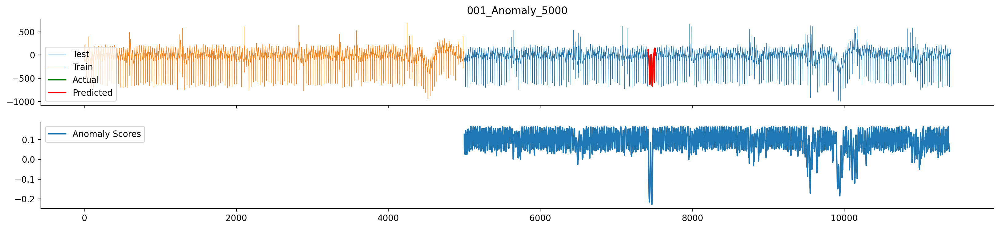

Current Score:  0.02007494646680942
phase_1/002_Anomaly_4375.csv
Dominant Period 13


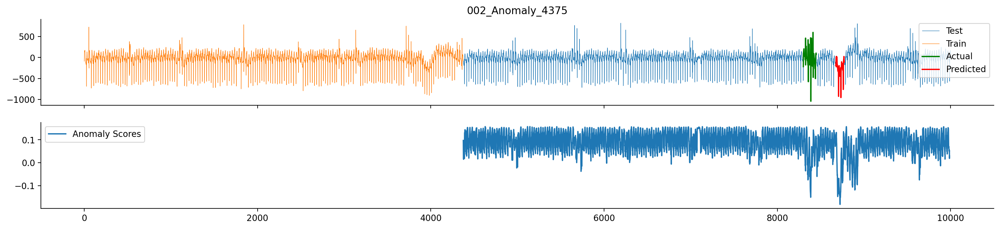

Current Score:  1.4024380240126988
phase_1/003_Anomaly_4375.csv
Dominant Period 13


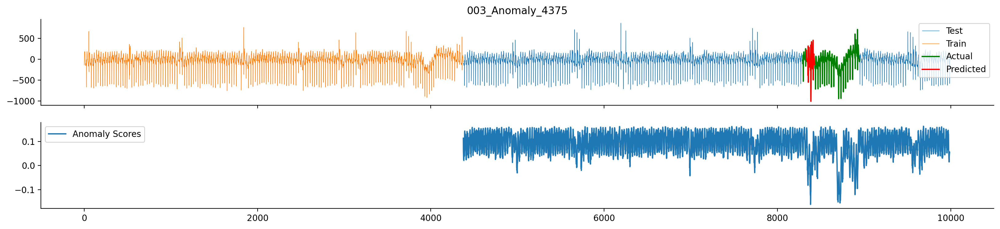

Current Score:  1.739183506408596
phase_1/004_Anomaly_2500.csv
Dominant Period 40


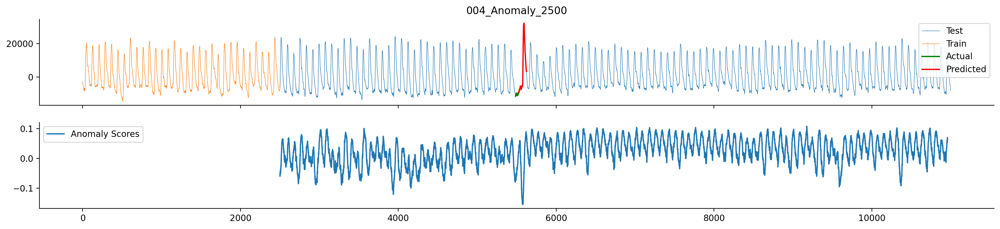

Current Score:  1.5614209864187167
phase_1/005_Anomaly_4000.csv
Dominant Period 11


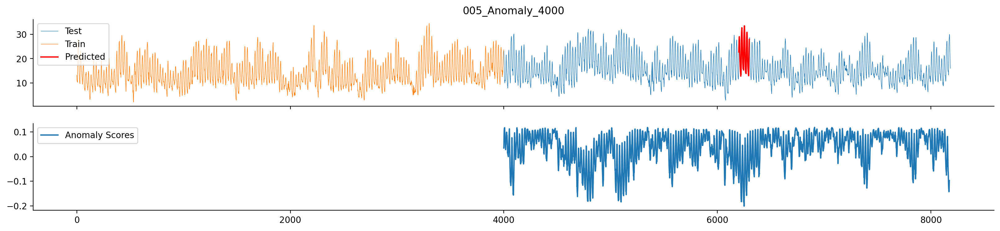

Current Score:  1.5614209864187167
phase_1/006_Anomaly_4000.csv
Dominant Period 11


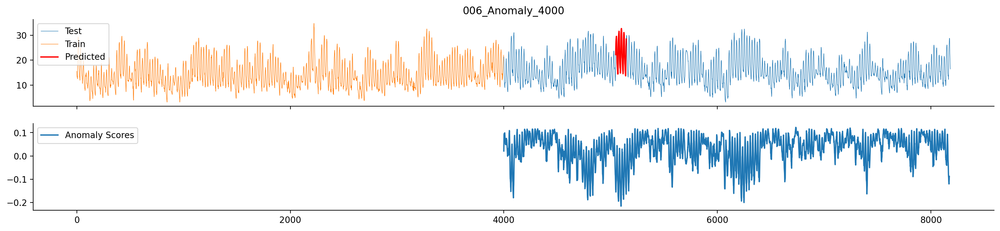

Current Score:  1.5614209864187167
phase_1/007_Anomaly_4000.csv
Dominant Period 11


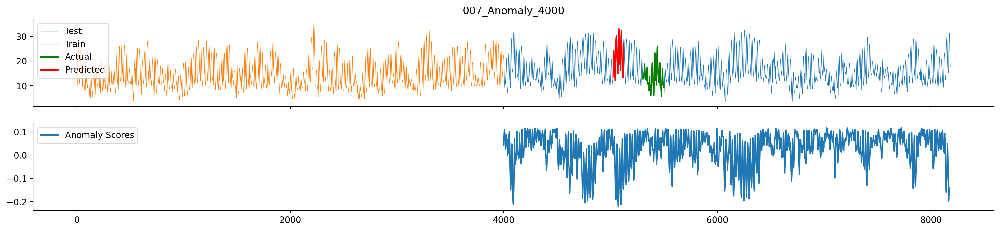

Current Score:  2.31044341460819
phase_1/008_Anomaly_4000.csv
Dominant Period 11


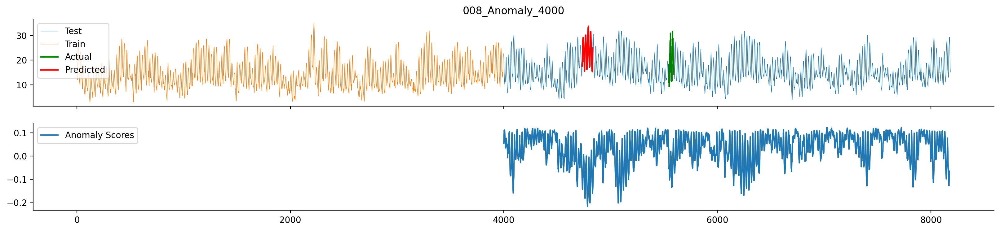

Current Score:  3.996281582872678
phase_1/009_Anomaly_4000.csv
Dominant Period 11


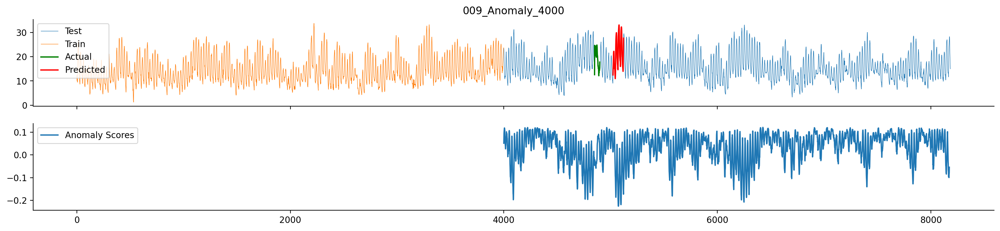

Current Score:  4.004438692705901
phase_1/010_Anomaly_4000.csv
Dominant Period 11


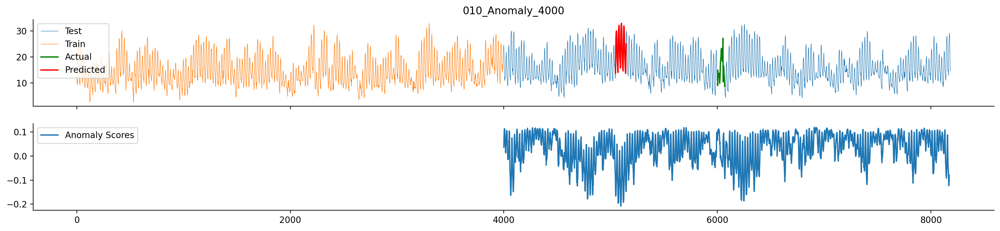

Current Score:  5.288305257918455
phase_1/011_Anomaly_3333.csv
Dominant Period 15


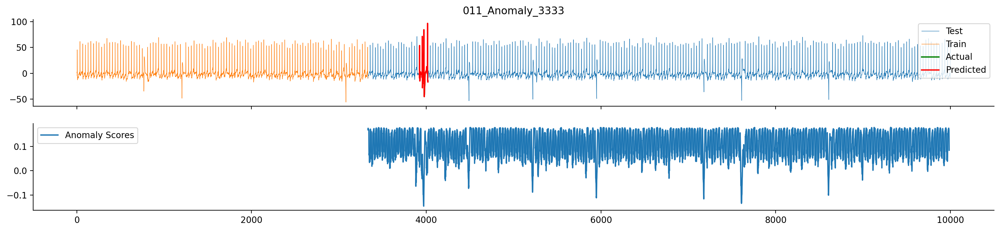

Current Score:  4.782087797453243
phase_1/012_Anomaly_5000.csv
Dominant Period 14


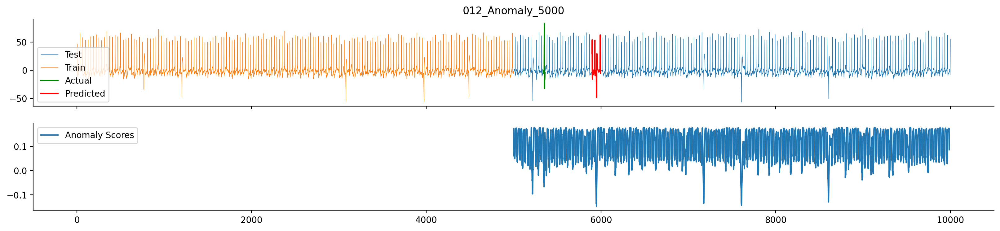

Current Score:  5.363495278908215
phase_1/013_Anomaly_5000.csv
Dominant Period 13


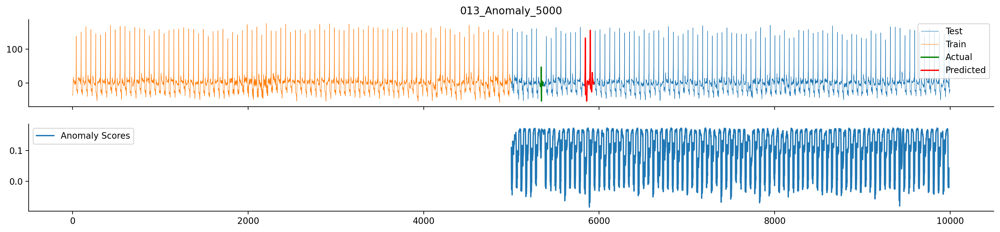

Current Score:  5.764682022504031
phase_1/014_Anomaly_2666.csv
Dominant Period 13


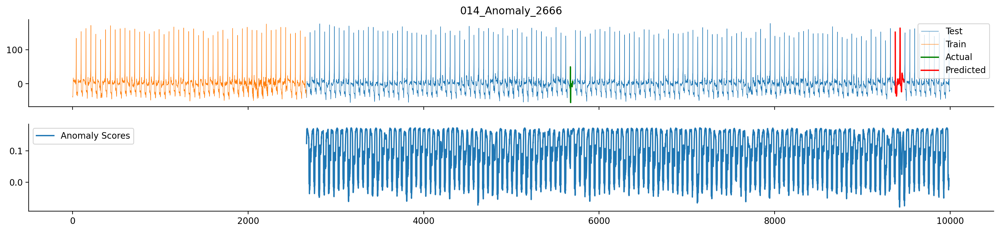

Current Score:  10.381795650838574
phase_1/015_Anomaly_250.csv
Dominant Period 22


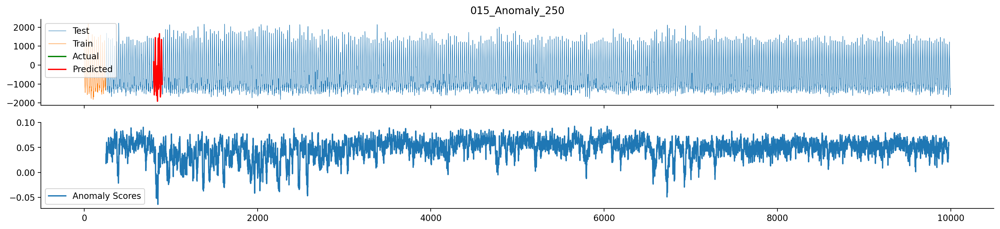

Current Score:  9.768553617609301
phase_1/016_Anomaly_1666.csv
Dominant Period 13


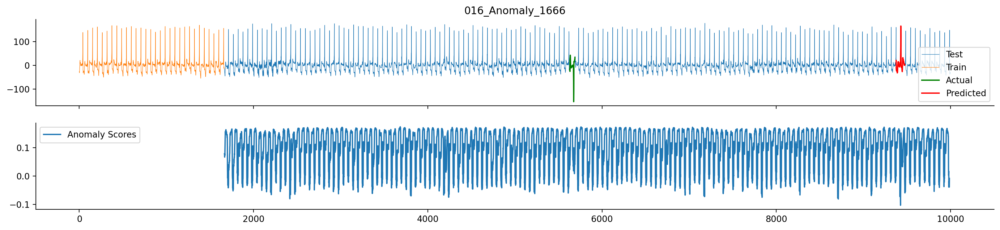

Current Score:  13.55312354133523
phase_1/017_Anomaly_1666.csv
Dominant Period 13


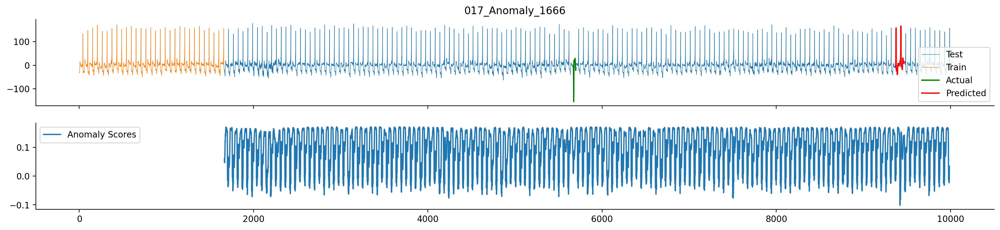

Current Score:  16.811154463361497
phase_1/018_Anomaly_2666.csv
Dominant Period 13


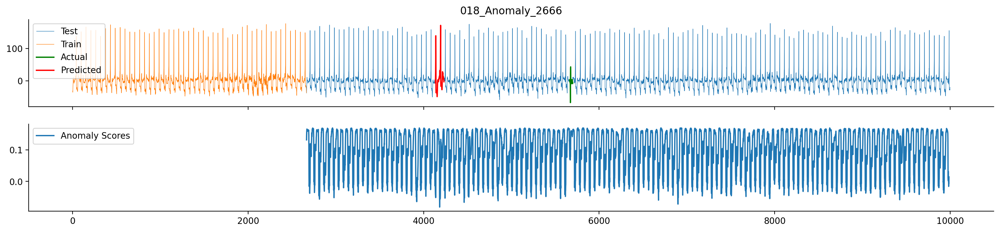

Current Score:  17.37411924729404
phase_1/019_Anomaly_5000.csv
Dominant Period 108


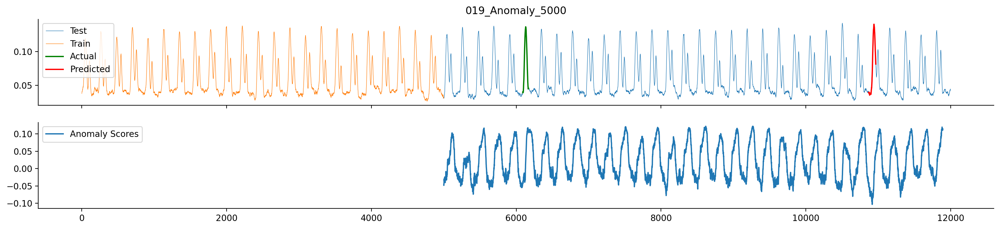

Current Score:  20.747298955596445
phase_1/020_Anomaly_5000.csv
Dominant Period 108


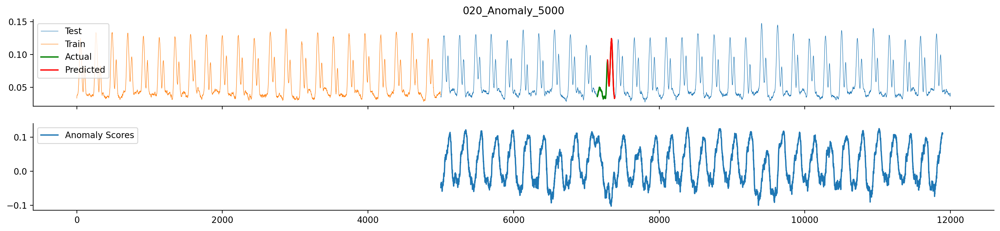

Current Score:  19.706012751244124
phase_1/021_Anomaly_5000.csv
Dominant Period 108


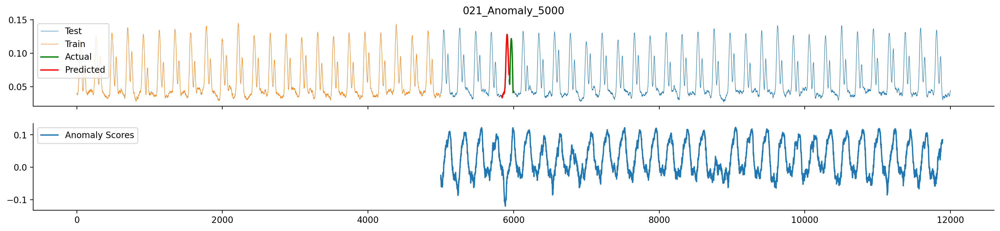

Current Score:  18.79106387247589
phase_1/022_Anomaly_4000.csv
Dominant Period 36


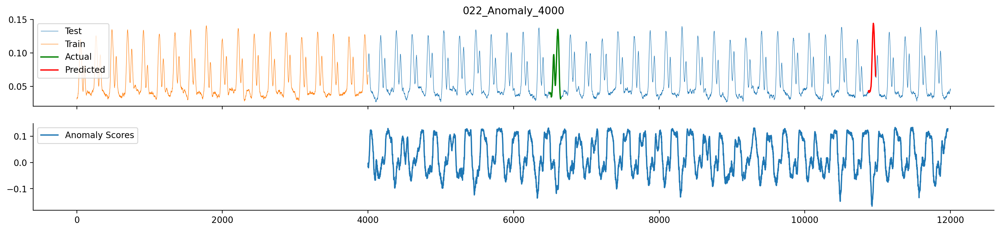

Current Score:  21.045264524574176
phase_1/023_Anomaly_5000.csv
Dominant Period 108


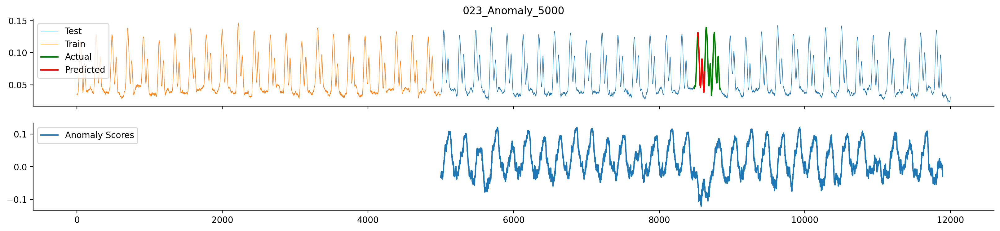

Current Score:  20.132751450971337
phase_1/024_Anomaly_3200.csv
Dominant Period 76


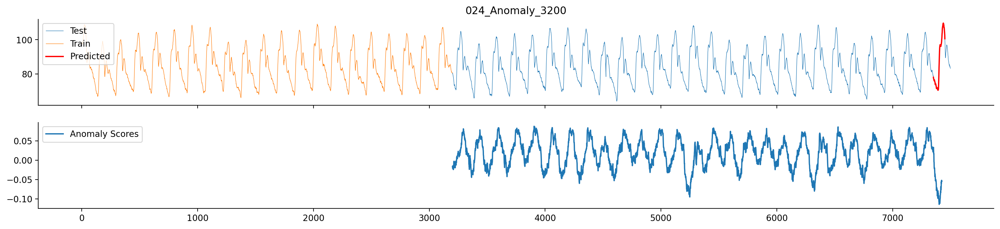

Current Score:  20.132751450971337
phase_1/025_Anomaly_2800.csv
Dominant Period 38


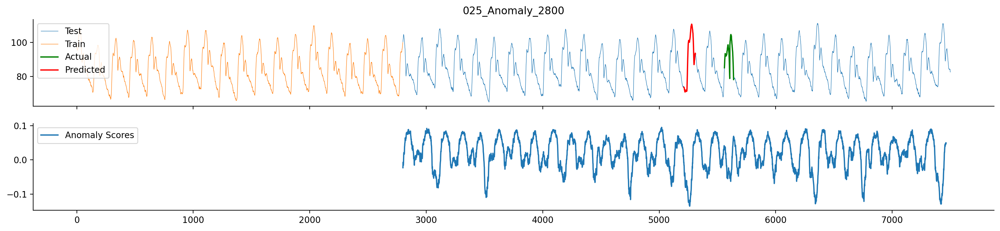

Current Score:  19.519836791612335
phase_1/026_Anomaly_1700.csv
Dominant Period 21


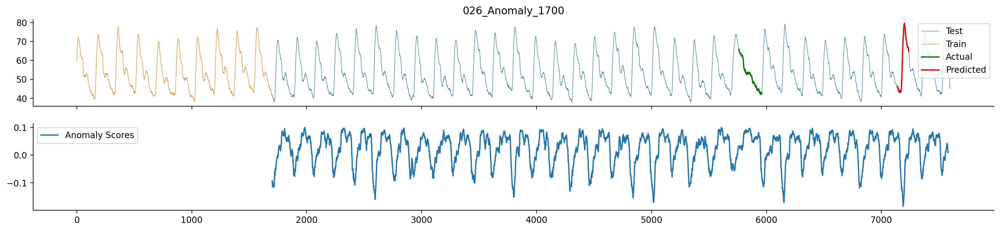

Current Score:  19.651476128935656
phase_1/027_Anomaly_1200.csv
Dominant Period 18


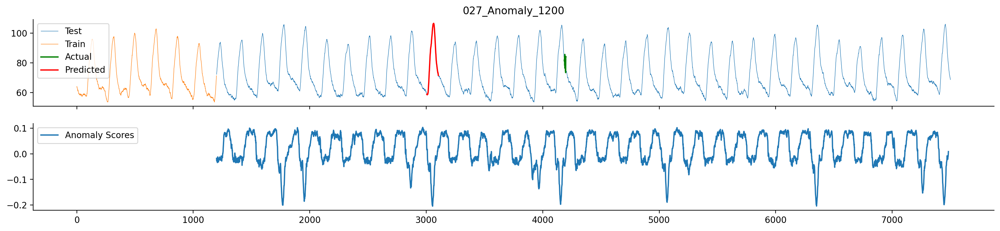

Current Score:  19.950340747900366
phase_1/028_Anomaly_1600.csv
Dominant Period 30


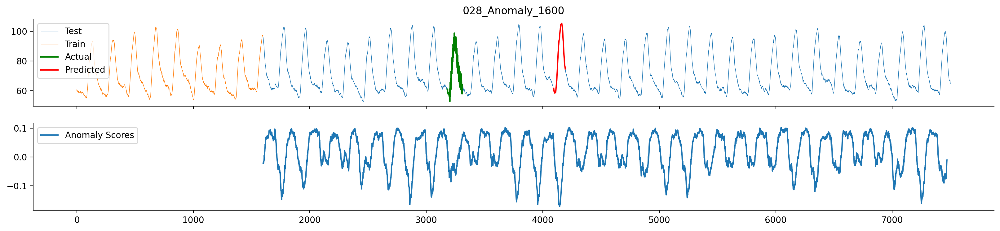

Current Score:  20.248564574770857
phase_1/029_Anomaly_2300.csv
Dominant Period 46


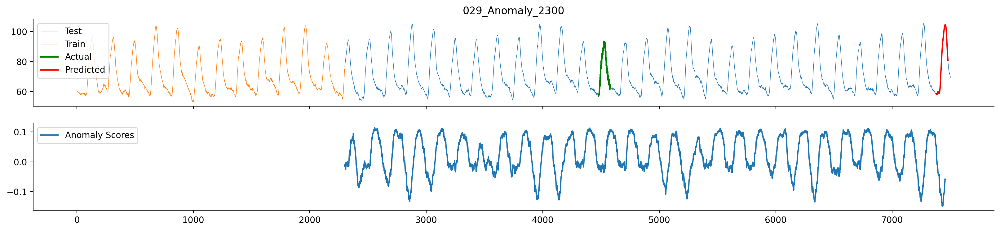

Current Score:  21.868824590111288
phase_1/030_Anomaly_3000.csv
Dominant Period 45


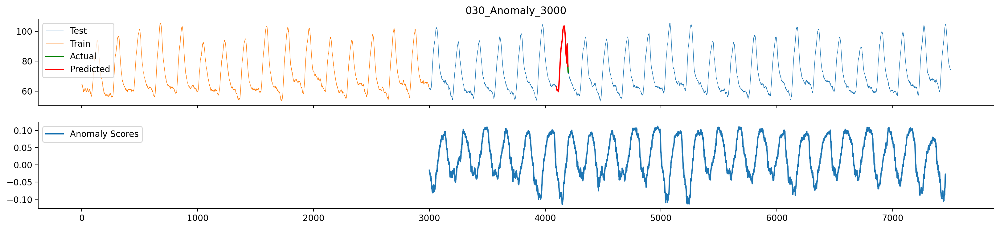

Current Score:  21.12697608830269
	Total score: 19.718511015749176


In [32]:
total_score = 0
predictions = []
ids = []
i = 1

for file in file_list:
    if "Anomaly" in str(file):
        file_name = file.split('.')[0]
        name, test_start, data, anomaly = read_series(file, locations)

        period = find_dominant_window_sizes(data[:test_start])
        print("Dominant Period", period)
        
        window_size = np.int32(period)
        X = sliding_window(data, window_size)

        # score, predicted = nearest_neighbor_based_score(X, test_start)            

        # TODO: uncomment as needed
        score, predicted = classifcation_based_scores(X, test_start)
        # score, predicted = regression_based_scores(X, test_start)        
        # score, predicted = forecasting_based_scores(X, test_start)
        # score, predicted = cluster_based_scores(X, test_start)
        # score, predicted = statistics_based_scores(data, X, test_start)
        
        predictions.append(predicted)
        ids.append(file_name)        
        score[:test_start] = np.nan

        # Visualize the predicted anomaly
        visualize_with_anomaly_score(
             data, score, test_start, predicted, anomaly, name)
        
        # Only check those, where the anomaly was annotated
        if (anomaly[0] > -1):
            anomaly = (anomaly[0] + anomaly[1]) // 2
            total_score += abs(anomaly - predicted) / (anomaly)
            i = i + 1
            
        print("Current Score: ", (total_score / i) * 100)

        
print("\tTotal score:", (total_score / len(locations)) * 100)

# Submit your solution to Kaggle

You must make at least **3 different submissions to Kaggle**.

<div class="alert alert-success alertsuccess" style="margin-top: 20px">
Create a submission named `submission.csv` using your model and upload it to kaggle:

- https://www.kaggle.com/competitions/time-series-anomaly-detection-exercise-WS-25-26


</div>

In [ ]:
# Create a submission
submission = pd.DataFrame({'ID': ids,'PREDICTED': predictions})

# Visualize the first 5 rows
display(submission)

filename = 'baseline_submission_phase_1.csv'
submission.to_csv(filename,index=False)
print('Saved file: ' + filename)

<hr> 

# Submit via Moodle:
- Your notebook with three approaches (or three notebooks)
- A html export of this notebook (or the three notebooks)
- The three submissions, which you used for kaggle

### You must hand in this exercise via moodle